<a href="https://colab.research.google.com/github/magourram/algo_mass_data/blob/main/amd_project_support_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Project 4: Image Classification by Support
Using the «Prado Museum Pictures» dataset of Project 3, the task is to implement a deep-learning-based system classifying pictures according to any reasonable organization of classes (e.g., by author–selecting a manageable subset of authors, or by support). Note that the dataset does not directly contain the picture images, but these can be downloaded separately using the work_image_url attribute of the  prado.csv file.

# Libraries

In [ ]:
import os
import time
import json
import glob

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.image import imread
import seaborn as sns
from PIL import Image
import shutil
from shutil import copyfile
import zipfile
import random
from tqdm import tqdm
from IPython.display import Image
from google.colab import files

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score, precision_score, recall_score
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
from sklearn.utils import class_weight

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, preprocessing
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Conv2D, MaxPooling2D, Flatten, Dropout, Input, AveragePooling2D, concatenate
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import plot_model, to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers.experimental.preprocessing import Rescaling

!pip install keras-tuner --upgrade --quiet
import keras_tuner as kt
from keras_tuner import HyperModel, RandomSearch
from keras.metrics import AUC, Precision, Recall, Accuracy
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, EarlyStopping ##

# Install kaggle
!pip install -q kaggle --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 1.9 MB/s eta 0:00:00


In [ ]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

## Kaggle API

In [ ]:
start_time = time.time()

In [ ]:
# To be replaced with 'xxxxxx'
os.environ['KAGGLE_USERNAME'] = "XXXXXX"
os.environ['KAGGLE_KEY'] = "XXXXXX"

In [ ]:
# Create a new directory
new_directory_path = '/content/zip_file'
!mkdir "{new_directory_path}"

In [ ]:
# Download dataset files and locatet it in the directory
%cd /content/zip_file
!kaggle datasets download -d maparla/prado-museum-pictures

/content/zip_file
100% 24.9G/24.9G [04:52<00:00, 159MB/s]
100% 24.9G/24.9G [04:52<00:00, 91.4MB/s]


# Functions

In [ ]:
# Function to extract images from a zipped file [remove]
def extract_file(zip_file_path, extraction_path):
  with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extraction_path)
    path = os.path.join(extraction_path, 'images', 'images')
    print(f'The number of images in the folder is: {count_images_in_folder(path)}')

In [ ]:
# Remove directories even if not empty
def remove_non_empty_directory(directory_path):
    try:
        shutil.rmtree(directory_path)
        print(f"Directory '{directory_path}' and its contents have been successfully removed.")
    except Exception as e:
        print(f"Error: {e}")

In [ ]:
# Count the number of images in folder
def count_images_in_folder(folder_path):
    extensions = ['jpg', 'jpeg', 'png']  # Add more if needed

    # Use glob to get a list of files with specified extensions
    image_files = [file for ext in extensions for file in glob.glob(os.path.join(folder_path, f'*.{ext}'))]

    # Count the number of image files
    num_images = len(image_files)

    return num_images

In [ ]:
# Count the number of images in each subfolder after the re-allocation
def count_images_in_subfolders(root_folder, data_split):
    folder_path = os.path.join(root_folder, data_split)

    for subfolder in os.listdir(folder_path):
        subfolder_path = os.path.join(folder_path, subfolder)

        if os.path.isdir(subfolder_path):
            # Counting the number of files with extension ".jpg" in each subfolder
            num_images = len([file for file in os.listdir(subfolder_path) if file.lower().endswith('.jpg')])

            # Printing the results
            print(f"Subfolder '{subfolder}' in '{data_split}' contains {num_images} images.")

In [ ]:
# Function to plot images
def plot_images_from_folder(folder, num_cols=2):
    # Get a list of subfolders in the train folder
    subfolders = [f.path for f in os.scandir(folder) if f.is_dir()]

    # Calculate number of rows required
    num_rows = (len(subfolders) + num_cols - 1) // num_cols

    # Set up the subplot grid
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

    # Flatten the axes array to make it easier to iterate
    axes = axes.flatten()

    # Plot one image from each subfolder
    for i, subfolder in enumerate(subfolders):
        # Get the list of images in the subfolder
        images = [f.path for f in os.scandir(subfolder) if f.is_file() and f.name.lower().endswith(('.png', '.jpg', '.jpeg'))]

        # Plot the first image in the subfolder
        if images:
            img_path = images[0]
            img = mpimg.imread(img_path)

            # Extract subfolder name from the path for the plot title
            subfolder_name = os.path.basename(subfolder)

            # Plot the image
            axes[i].imshow(img)
            axes[i].set_title(subfolder_name)
            axes[i].axis('off')  # Turn off axis labels

    # Adjust layout for better spacing
    plt.tight_layout()
    plt.show()

# Setup

### Zip Extraction

In [ ]:
# Set the path to zip file
zip_file_path = '/content/zip_file/prado-museum-pictures.zip'

# Set the path for the zip extraction
extraction_path = '/content/zip_file'
os.makedirs(extraction_path, exist_ok=True)

# Extract images using function
extract_file(zip_file_path, extraction_path)

The number of images in the folder is: 13472


### Accessing csv file

In [ ]:
# Reading the dataframe and make it accessible
extraction_path = "/content/zip_file"
df = pd.read_csv(os.path.join(extraction_path, "prado.csv"))

df["work_id"] = df['work_image_url'].apply(lambda x: x.split('/')[-1])

for _, row in df.iterrows():
    image_id = row["work_id"]
    image_path = os.path.join("images", image_id)

# Remove unneccesary columns
columns_to_drop = [0, 1, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
df.drop(columns=df.columns[columns_to_drop], inplace=True)

In [ ]:
# Plot the generic information about the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13487 entries, 0 to 13486
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   author                   13487 non-null  object
 1   author_id                12360 non-null  object
 2   technical_sheet_tecnica  13390 non-null  object
 3   work_id                  13487 non-null  object
dtypes: object(4)
memory usage: 421.6+ KB


### Analysis of the support

In [ ]:
# Extract the main types of support used
df['support'] = df['technical_sheet_tecnica'].apply(lambda x: str(x).split(';')[0] if pd.notna(x) and ';' in str(x) else str(x))

# Create a copy of the original dataframe and remove empty cells from author_id
df = df.dropna(subset=['support'])

# Create a new column 'total_occurrences' based on 'author_id' counts for EDA purposes
df['total_occurrences'] = df['support'].map(df['support'].value_counts())

df

,author,author_id,technical_sheet_tecnica,work_id,support,total_occurrences
0,"Bayeu y Subías, Francisco",b218fee4-053b-4656-8577-9aa001ad1989,Lápiz negro,404387d6-a52c-4477-b598-de2a2d5a3d55.jpg,Lápiz negro,440
1,"Crespi, Giuseppe Maria",b20a5ee9-2ebd-4e60-aadc-e91e7867cb12,Sanguina,589ee4a3-28fa-4977-a84d-7326f5c9aeb3.jpg,Sanguina,394
2,"Cronenburch, Adriaen van",26861819-ff88-4fde-8a37-56db9e1c1ba4,Óleo,4a8bab74-ca91-450a-b5b7-39dd61e2d7f3.jpg,Óleo,4166
3,"González Velázquez, Zacarías",a8c659ad-d887-4703-8af3-1832dfc88eb7,Óleo,9af5b176-b4d3-4930-854b-5b5f252829f1.jpg,Óleo,4166
4,"Obra copiada de Cano de la Peña, Eduardo",521b82d6-6848-4f7d-96dc-3b8f102dd8b5,Óleo,4c494f0a-d5ae-45ca-826b-59f4b5fd4398.jpg,Óleo,4166
...,...,...,...,...,...,...
13482,"Atribuido Falck, Jeremías",d351c3c1-e89b-49cf-900d-24085ed1908f,Aguafuerte; Buril; Estampa iluminada,c62f7f3e-3ad3-4d9e-9586-b0b389b2d032.jpg,Aguafuerte,415
13483,"Atribuido Kiyonobu, Tori",9e420297-9fb9-4ef3-b128-96596d5dc191,Entalladura [madera a la fibra],6c28accf-e0c0-4bc0-b4c6-3fbb282bcbd8.jpg,Entalladura [madera a la fibra],23
13484,"García, Sergio",d984cdeb-020c-41f9-ae68-3285aebfa25a,"Aguada de pigmentos opacos [gouache, témpera];...",b4126fb6-c5ac-40e3-89a1-d1578914c09b.jpg,"Aguada de pigmentos opacos [gouache, témpera]",164
13485,Anónimo,99d7590d-7ec8-4da4-bc2f-92064214c76c,Gelatina / Colodión,e7bf2481-522c-4071-9d97-7908aca45831.jpg,Gelatina / Colodión,149


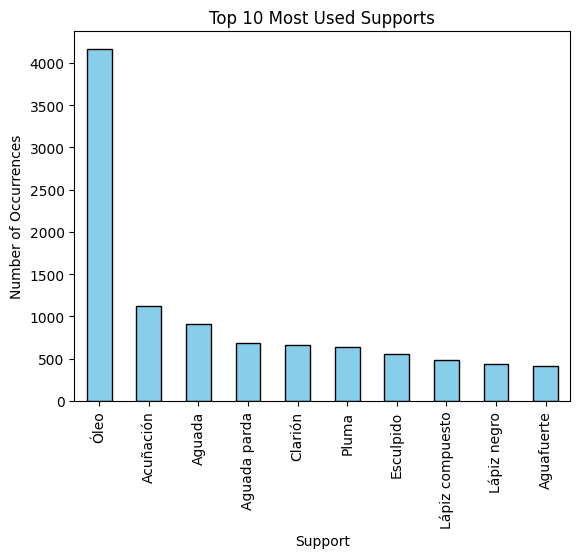

In [ ]:
# Get the 10 most recurrent supports
top_supports = df['support'].value_counts().head(10)

# Plotting
top_supports.plot(kind='bar', color='skyblue', edgecolor='black')
plt.xlabel('Support')
plt.ylabel('Number of Occurrences')
plt.title('Top 10 Most Used Supports')

plt.show()

In [ ]:
df_support = df[['technical_sheet_tecnica', 'support', 'total_occurrences']].drop_duplicates(subset='support').reset_index(drop=True)
df_support

,technical_sheet_tecnica,support,total_occurrences
0,Lápiz negro,Lápiz negro,440
1,Sanguina,Sanguina,394
2,Óleo,Óleo,4166
3,Lápiz,Lápiz,282
4,Aguada; Albayalde; Pluma,Aguada,909
...,...,...,...
108,Hierros dorados,Hierros dorados,1
109,Papel baritado,Papel baritado,1
110,Patinado,Patinado,1
111,Técnicas téxtiles,Técnicas téxtiles,2


### Setting up sample of images (support)

In [ ]:
# Filter rows with 'total_occurrences' at least minimum_img (number of images per type of support)
minimum_img_support = 500 #to be adjusted number of images for each author
df_support_final = df_support[df_support['total_occurrences'] >= minimum_img_support].reset_index(drop=True)
df_support_final

,technical_sheet_tecnica,support,total_occurrences
0,Óleo,Óleo,4166
1,Aguada; Albayalde; Pluma,Aguada,909
2,Acuñación,Acuñación,1120
3,Pluma; Tinta parda,Pluma,633
4,Clarión; Lápiz negro,Clarión,663
5,Aguada parda; Lápiz negro; Pluma,Aguada parda,681
6,Esculpido,Esculpido,558


In [ ]:
# Settings
total_number_classes_support = len(df_support_final) #depending on minimum_img_supp
print("Number of rows in the DataFrame:", total_number_classes_support)

Number of rows in the DataFrame: 7


In [ ]:
# Train to be adjusted; val and test same ratio
train_ratio = 0.6
val_ratio = round((1 - train_ratio)/2,2)
test_ratio = round(1 - train_ratio - val_ratio,2)

In [ ]:
# Results after setting (macro level)
print("Total images at disposable:", total_number_classes_support * minimum_img_support, "\n")
print("Images used in training:", total_number_classes_support * minimum_img_support * train_ratio)
print("Images used in validation:", total_number_classes_support * minimum_img_support * val_ratio)
print("Images used in test:", total_number_classes_support * minimum_img_support * test_ratio, "\n")

# Results after setting (micro level)
print("Images in each training class:", (total_number_classes_support * minimum_img_support * train_ratio) / total_number_classes_support)
print("Images in each validation class:", (total_number_classes_support * minimum_img_support * val_ratio) / total_number_classes_support)
print("Images in each test class:", (total_number_classes_support * minimum_img_support * test_ratio) / total_number_classes_support)

Total images at disposable: 3500 

Images used in training: 2100.0
Images used in validation: 700.0
Images used in test: 700.0 

Images in each training class: 300.0
Images in each validation class: 100.0
Images in each test class: 100.0


### Classes definition

In [ ]:
# Classes names obtained from previous calculation
classes_names_support = df_support_final['support'].tolist()
print(classes_names_support)

['Óleo', 'Aguada', 'Acuñación', 'Pluma', 'Clarión', 'Aguada parda', 'Esculpido']


### Extraction of images and check existence for consistency

In [ ]:
np.random.seed(42)

result_support_df = pd.DataFrame()

# Loop through each ID in the list
for supp in classes_names_support:
    # Sample all available rows for each ID
    all_rows_supp = df[df['support'] == supp]

    # Extract work_id from all sampled rows
    work_ids_supp = all_rows_supp['work_id'].tolist()

    # Check if related images exist in another folder
    existing_work_ids_supp = [work_id for work_id in work_ids_supp if os.path.exists(f"/content/zip_file/images/images/{work_id}")]

    # If there are more than minimum_img existing images, sample 100 randomly
    if len(existing_work_ids_supp) >= minimum_img_support:
        sampled_work_ids_supp = np.random.choice(existing_work_ids_supp, size=minimum_img_support, replace=False)
    else:
        # If there are fewer than minimum_img existing images, sample with replacement
        sampled_work_ids_supp = np.random.choice(existing_work_ids_supp, size=minimum_img_support, replace=False)

    # Filter rows based on the sampled work_ids
    sampled_rows_supp = all_rows_supp[all_rows_supp['work_id'].isin(sampled_work_ids_supp)]

    # Use pandas.concat instead of append
    result_support_df = pd.concat([result_support_df, sampled_rows_supp], ignore_index=True)

result_support_df = result_support_df.sample(frac=1, random_state=42).reset_index(drop=True)

result_support_df

,author,author_id,technical_sheet_tecnica,work_id,support,total_occurrences
0,"Ribera y Fieve, Carlos Luis de",5e2996c9-53ec-4b75-ac76-eb4ead2cf6c0,Pluma; Tinta parda; Lápiz compuesto,a37663cd-693f-4d1d-a627-07b3811f37bd.jpg,Pluma,633
1,"Bayeu y Subías, Francisco",b218fee4-053b-4656-8577-9aa001ad1989,Clarión; Sanguina,877f9c79-278b-4d4a-9e45-05af8ccbd515.jpg,Clarión,663
2,"López Portaña, Vicente",8caad4ee-a045-43f8-8c06-9e45623a9d84,Clarión; Lápiz negro; Sanguina,2e0fe2ba-10d6-4b6f-9e89-626ff71e1f01.jpg,Clarión,663
3,Anónimo,99d7590d-7ec8-4da4-bc2f-92064214c76c,Pluma,31e952e7-a5f5-4a23-b5cb-4ecb0e5838ca.jpg,Pluma,633
4,"López Portaña, Vicente",8caad4ee-a045-43f8-8c06-9e45623a9d84,Óleo,fcb4b4fc-0210-4405-82f8-7df3c82bd7ee.jpg,Óleo,4166
...,...,...,...,...,...,...
3495,Anónimo,99d7590d-7ec8-4da4-bc2f-92064214c76c,Acuñación,8a47e82c-dd17-41c6-af15-39cb9a5d43cc.jpg,Acuñación,1120
3496,Anónimo,99d7590d-7ec8-4da4-bc2f-92064214c76c,Acuñación,7e90eb06-99fa-47d3-a9aa-c6e5f66b7b22.jpg,Acuñación,1120
3497,"Maura y Montaner, Bartolomé",3c6f515b-f504-4ffa-aaf7-03e338681832,Acuñación,2de382ec-1aef-4098-b2b3-c5cdcb9c4e9d.jpg,Acuñación,1120
3498,"Rodríguez, Antonio",74d8c990-391c-42c3-a8af-35d815498c4f,Aguada; Lápiz negro; Pincel; Tinta de hollín; ...,1a602996-bfdf-4110-9e95-fc7aded37279.jpg,Aguada,909


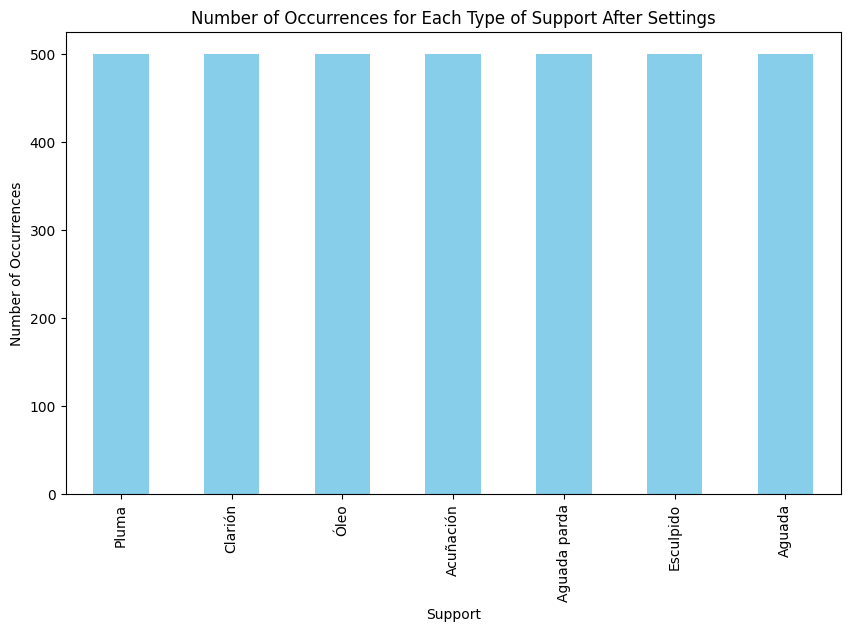

In [ ]:
# Extract list of the useful id related to images
support_list = result_support_df['work_id'].to_list()
len(support_list)

# Count the occurrences of each author in result_df
support_counts = result_support_df['support'].value_counts()

# Plot the histogram
plt.figure(figsize=(10, 6))
support_counts.plot(kind='bar', color='skyblue')
plt.title('Number of Occurrences for Each Type of Support After Settings')
plt.xlabel('Support')
plt.ylabel('Number of Occurrences')
plt.show()

In [ ]:
# Loop through the work_ids list and check if all file exists
for file_name in support_list:
    file_path = os.path.join(extraction_path, 'images', 'images', file_name)

    if not os.path.exists(file_path):
        print(f"File {file_name} does not exist in the directory.")

all_files_exist_support = all(os.path.exists(os.path.join(extraction_path, 'images', 'images', file_name)) for file_name in work_ids_supp)
print(f"All files exist? {all_files_exist_support}")

All files exist? True


In [ ]:
# Creating a dataframe with the data related to the work_id_list
result_support_df_final = result_support_df[result_support_df['work_id']==support_list]

# Add a column with the path to the images
result_support_df_final['image_path'] = result_support_df_final['work_id'].apply(lambda filename: os.path.join(extraction_path, 'images', 'images', filename))
result_support_df_final

,author,author_id,technical_sheet_tecnica,work_id,support,total_occurrences,image_path
0,"Ribera y Fieve, Carlos Luis de",5e2996c9-53ec-4b75-ac76-eb4ead2cf6c0,Pluma; Tinta parda; Lápiz compuesto,a37663cd-693f-4d1d-a627-07b3811f37bd.jpg,Pluma,633,/content/zip_file/images/images/a37663cd-693f-...
1,"Bayeu y Subías, Francisco",b218fee4-053b-4656-8577-9aa001ad1989,Clarión; Sanguina,877f9c79-278b-4d4a-9e45-05af8ccbd515.jpg,Clarión,663,/content/zip_file/images/images/877f9c79-278b-...
2,"López Portaña, Vicente",8caad4ee-a045-43f8-8c06-9e45623a9d84,Clarión; Lápiz negro; Sanguina,2e0fe2ba-10d6-4b6f-9e89-626ff71e1f01.jpg,Clarión,663,/content/zip_file/images/images/2e0fe2ba-10d6-...
3,Anónimo,99d7590d-7ec8-4da4-bc2f-92064214c76c,Pluma,31e952e7-a5f5-4a23-b5cb-4ecb0e5838ca.jpg,Pluma,633,/content/zip_file/images/images/31e952e7-a5f5-...
4,"López Portaña, Vicente",8caad4ee-a045-43f8-8c06-9e45623a9d84,Óleo,fcb4b4fc-0210-4405-82f8-7df3c82bd7ee.jpg,Óleo,4166,/content/zip_file/images/images/fcb4b4fc-0210-...
...,...,...,...,...,...,...,...
3495,Anónimo,99d7590d-7ec8-4da4-bc2f-92064214c76c,Acuñación,8a47e82c-dd17-41c6-af15-39cb9a5d43cc.jpg,Acuñación,1120,/content/zip_file/images/images/8a47e82c-dd17-...
3496,Anónimo,99d7590d-7ec8-4da4-bc2f-92064214c76c,Acuñación,7e90eb06-99fa-47d3-a9aa-c6e5f66b7b22.jpg,Acuñación,1120,/content/zip_file/images/images/7e90eb06-99fa-...
3497,"Maura y Montaner, Bartolomé",3c6f515b-f504-4ffa-aaf7-03e338681832,Acuñación,2de382ec-1aef-4098-b2b3-c5cdcb9c4e9d.jpg,Acuñación,1120,/content/zip_file/images/images/2de382ec-1aef-...
3498,"Rodríguez, Antonio",74d8c990-391c-42c3-a8af-35d815498c4f,Aguada; Lápiz negro; Pincel; Tinta de hollín; ...,1a602996-bfdf-4110-9e95-fc7aded37279.jpg,Aguada,909,/content/zip_file/images/images/1a602996-bfdf-...


### Moving images

In [ ]:
# Define the paths
source_folder = os.path.join(extraction_path, 'images', 'images')
output_folder_support = '/content/prado_support'
os.makedirs(output_folder_support, exist_ok=True)

random_seed = 42

# Create train, test, and validation splits
sss_test = StratifiedShuffleSplit(n_splits=1, test_size=test_ratio + val_ratio, random_state=random_seed)
for train_index, test_validation_index in sss_test.split(result_support_df_final, result_support_df_final['support']):
    train_df = result_support_df_final.iloc[train_index]
    test_validation_df = result_support_df_final.iloc[test_validation_index]

sss_validation = StratifiedShuffleSplit(n_splits=1, test_size= val_ratio / (test_ratio + val_ratio), random_state=random_seed)
for test_index, validation_index in sss_validation.split(test_validation_df, test_validation_df['support']):
    test_df = test_validation_df.iloc[test_index]
    validation_df = test_validation_df.iloc[validation_index]

# Create train, test, and validation folders
for split in ['train', 'test', 'validation']:
    split_folder = os.path.join(output_folder_support, split)
    os.makedirs(split_folder, exist_ok=True)

    # Create subfolders for each author
    for support in result_support_df_final['support'].unique():
        support_folder = os.path.join(split_folder, str(support))
        os.makedirs(support_folder, exist_ok=True)

# Move images to their respective folders
for split, current_df in zip(['train', 'test', 'validation'], [train_df, test_df, validation_df]):
    for index, row in current_df.iterrows():
        source_path = os.path.join(source_folder, row['work_id'])
        destination_path = os.path.join(output_folder_support, split, str(row['support']), os.path.basename(row['image_path']))
        shutil.copy(source_path, destination_path)

In [ ]:
# Count images in the "train" and "test" subfolders
print("---   TRAIN   ---")
count_images_in_subfolders(output_folder_support, "train")
print("---------------------")
print("---   VALIDATION   ---")
count_images_in_subfolders(output_folder_support, "validation")
print("---------------------")
print("---   TEST   ---")
count_images_in_subfolders(output_folder_support, "test")
print("---------------------")

---   TRAIN   ---
Subfolder 'Aguada parda' in 'train' contains 300 images.
Subfolder 'Pluma' in 'train' contains 300 images.
Subfolder 'Esculpido' in 'train' contains 300 images.
Subfolder 'Aguada' in 'train' contains 300 images.
Subfolder 'Óleo' in 'train' contains 300 images.
Subfolder 'Clarión' in 'train' contains 300 images.
Subfolder 'Acuñación' in 'train' contains 300 images.
---------------------
---   VALIDATION   ---
Subfolder 'Aguada parda' in 'validation' contains 100 images.
Subfolder 'Pluma' in 'validation' contains 100 images.
Subfolder 'Esculpido' in 'validation' contains 100 images.
Subfolder 'Aguada' in 'validation' contains 100 images.
Subfolder 'Óleo' in 'validation' contains 100 images.
Subfolder 'Clarión' in 'validation' contains 100 images.
Subfolder 'Acuñación' in 'validation' contains 100 images.
---------------------
---   TEST   ---
Subfolder 'Aguada parda' in 'test' contains 100 images.
Subfolder 'Pluma' in 'test' contains 100 images.
Subfolder 'Esculpido' in

## Plot images

In [ ]:
train_path_supp = os.path.join(output_folder_support, 'train')
validation_path_supp = os.path.join(output_folder_support, 'validation')
test_path_supp = os.path.join(output_folder_support, 'test')

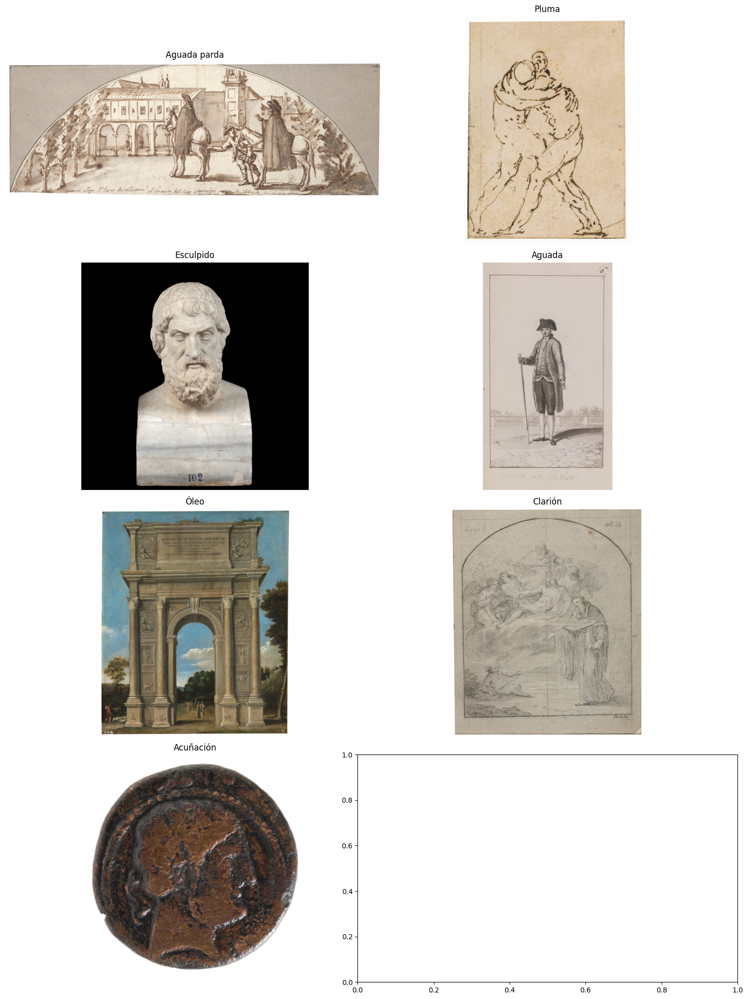

In [ ]:
#Train
plot_images_from_folder(train_path_supp)

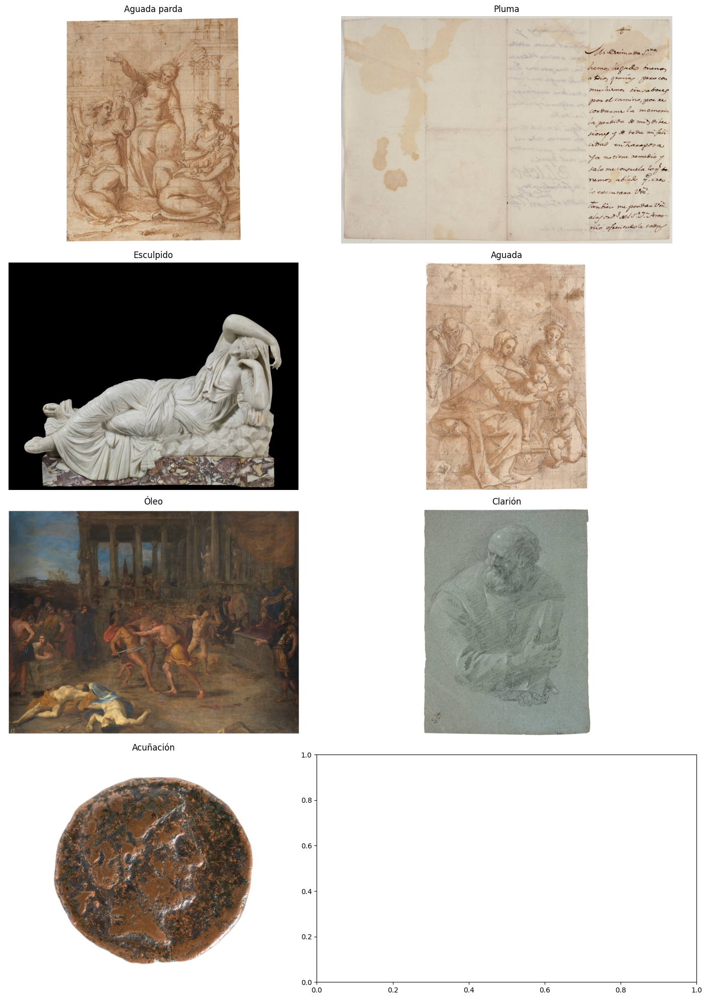

In [ ]:
#Test
plot_images_from_folder(validation_path_supp)

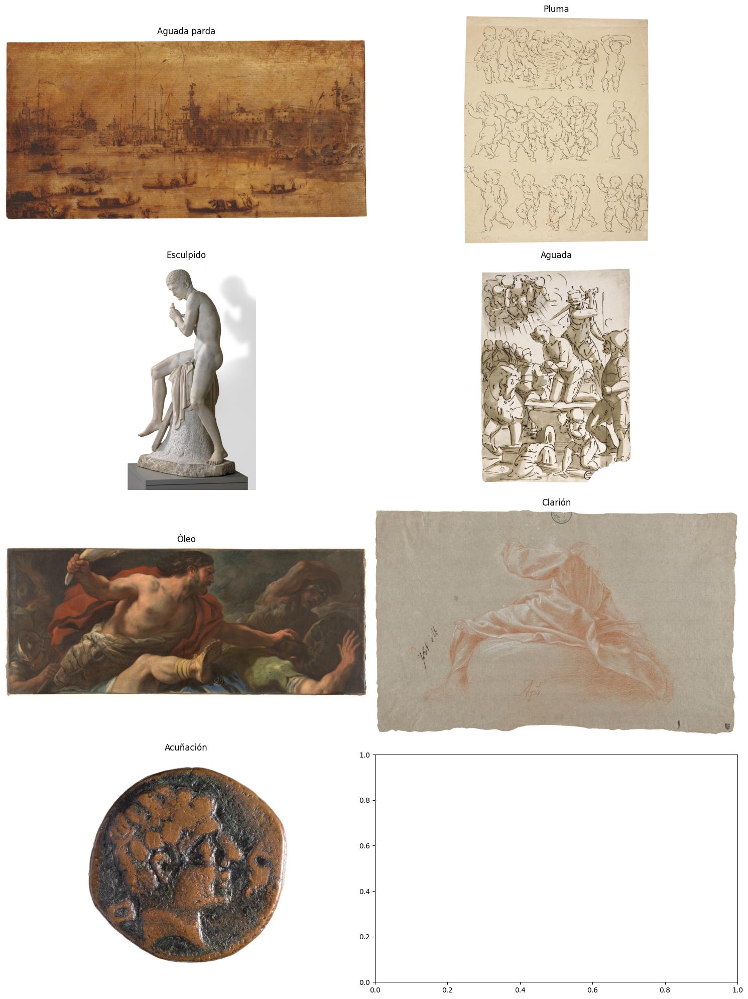

In [ ]:
#Validation
plot_images_from_folder(test_path_supp)

## Image processing

In [ ]:
# Definition of parameters
HEIGHT = 64
WIDTH = 64
BATCH = 10
EPOCHS = 20

In [ ]:
# Generation of tf dataset from images in the directories
train_data_supp = tf.keras.utils.image_dataset_from_directory(
    train_path_supp,
    image_size = (HEIGHT, WIDTH),
    interpolation='mitchellcubic',
    crop_to_aspect_ratio=True,
    seed=42,
    shuffle=True,
    batch_size=BATCH
    )

validation_data_supp = tf.keras.utils.image_dataset_from_directory(
    validation_path_supp,
    image_size = (HEIGHT, WIDTH),
    interpolation='mitchellcubic',
    crop_to_aspect_ratio=True,
    seed=42,
    shuffle=True,
    batch_size=BATCH
    )

test_data_supp = tf.keras.utils.image_dataset_from_directory(
    test_path_supp,
    image_size=(HEIGHT, WIDTH),
    interpolation='mitchellcubic',
    crop_to_aspect_ratio=True,
    seed=42,
    shuffle=True,
    batch_size=BATCH
)

Found 2100 files belonging to 7 classes.
Found 700 files belonging to 7 classes.
Found 700 files belonging to 7 classes.


In [ ]:
# Extraction of classes from tf.Dataset
classes_supp = train_data_supp.class_names
classes_supp

['Acuñación',
 'Aguada',
 'Aguada parda',
 'Clarión',
 'Esculpido',
 'Pluma',
 'Óleo']

In [ ]:
# Compute class weights
weights_class_supp = class_weight.compute_class_weight(class_weight='balanced',
                                                       classes=np.unique(classes_supp),
                                                       y=classes_supp)

weights_class_supp = {i: 1.0 for i in dict(enumerate(weights_class_supp)).keys()}
weights_class_supp

{0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0, 4: 1.0, 5: 1.0, 6: 1.0}

## EDA

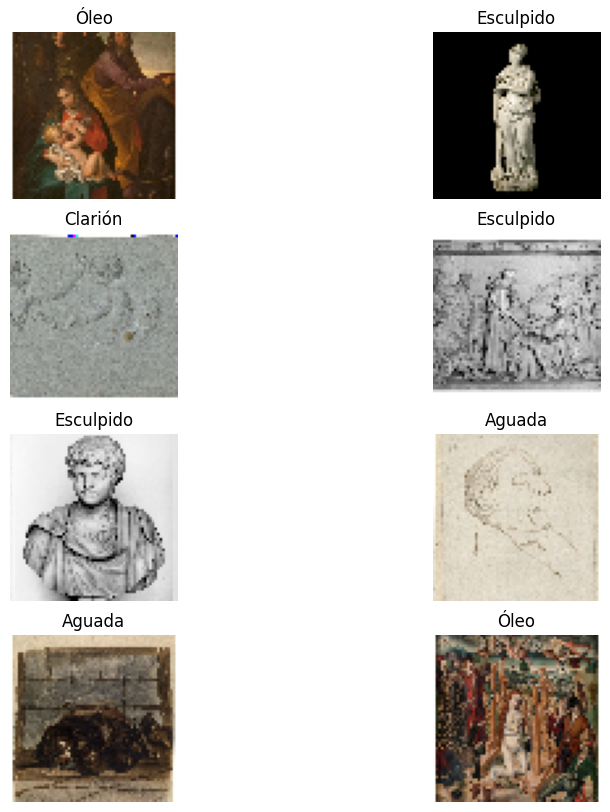

In [ ]:
# Plotting images from train data
plt.figure(figsize=(10,10))

for images, labels in train_data_supp.take(1):
  for i in range(8):
    ax = plt.subplot(4,2,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(classes_supp[labels[i]])
    plt.axis('off')

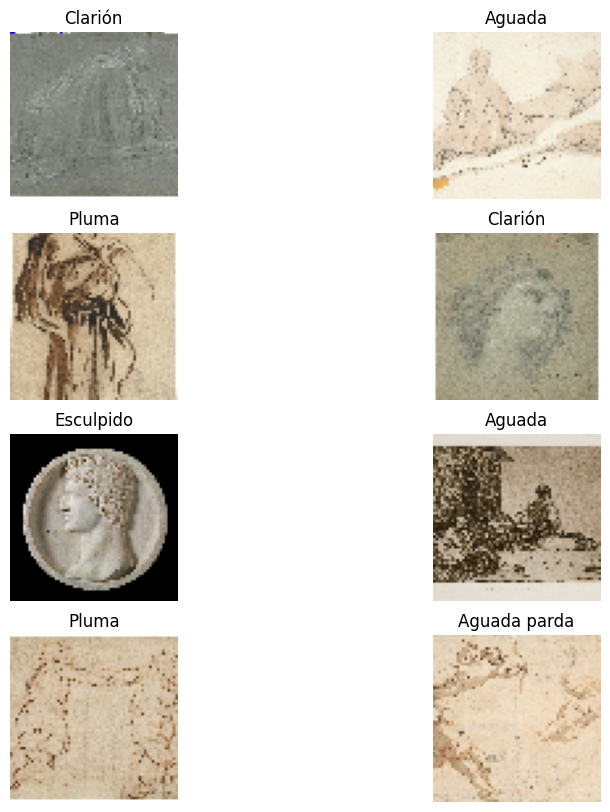

In [ ]:
# Plotting images from validation data
plt.figure(figsize=(10,10))

for images, labels in validation_data_supp.take(1):
  for i in range(8):
    ax = plt.subplot(4,2,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(classes_supp[labels[i]])
    plt.axis('off')

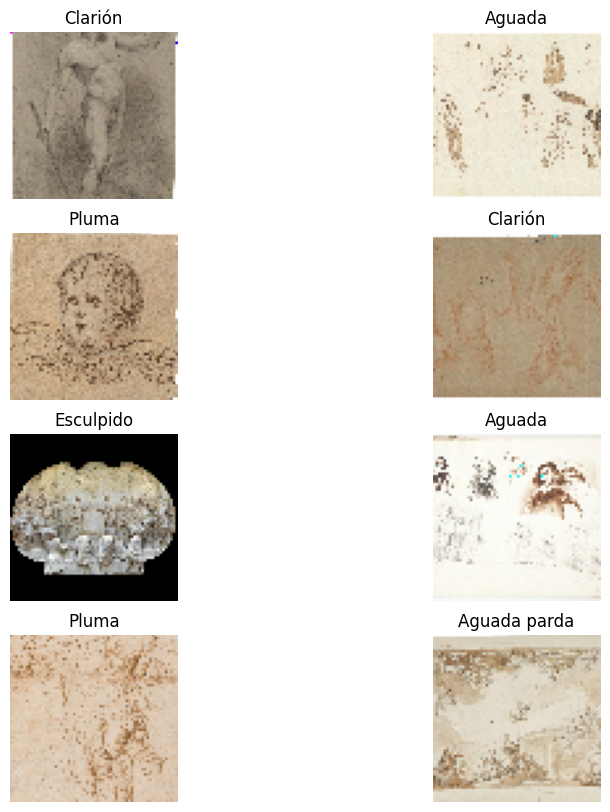

In [ ]:
# Plotting images from test data
plt.figure(figsize=(10,10))

for images, labels in test_data_supp.take(1):
  for i in range(8):
    ax = plt.subplot(4,2,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(classes_supp[labels[i]])
    plt.axis('off')

## Model Preparation and Deployment

In [ ]:
# data augmentation pipeline
train_aug_supp = Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical", input_shape = (HEIGHT, WIDTH, 3)), #random horizontal and vertical flips to the input images
    layers.RandomBrightness(0.2), #adjusts the brightness of the images
    layers.RandomContrast(0.2), #adjusts the contrast of the images

    #layers.experimental.preprocessing.RandomZoom(height_factor=(-0.05, -0.15),width_factor=(-0.05, -0.15),fill_mode='nearest'), #layer introduces random zooming to the images and fills empty areas in zooms
    #layers.RandomTranslation(0.05, 0.05), #random translations to the images in both the horizontal and vertical directions
    #layers.RandomRotation(0.2) #random rotations to the images
])

In [ ]:
# Dynamic tuning of performance-related parameters
AUTOTUNE = tf.data.AUTOTUNE

# Optimizing the data loading pipeline for training and validation by caching, shuffling, and prefetching the dataset elements
train_data_supp = train_data_supp.cache().shuffle(100, seed=random_seed).prefetch(buffer_size=AUTOTUNE)
validation_data_supp = validation_data_supp.cache().prefetch(buffer_size=AUTOTUNE)

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Base model

In [ ]:
# Model definition
def base_model():
  model = Sequential()
  #model.add(train_aug)
  model.add(layers.Rescaling(1./255, input_shape = (HEIGHT, WIDTH, 3)))

  model.add(layers.Conv2D(16, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.MaxPooling2D())

  model.add(layers.Conv2D(32, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.MaxPooling2D())

  model.add(layers.Conv2D(64, kernel_size = (3,3), padding = 'same', activation = 'relu'))
  model.add(layers.MaxPooling2D())

  model.add(layers.Conv2D(128, kernel_size = (3,3), padding = 'same', activation = 'relu'))
  model.add(layers.MaxPooling2D())

  model.add(layers.Flatten())
  model.add(layers.Dense(128, activation = 'relu'))
  model.add(layers.Dense(len(classes_supp)))

  model.compile(optimizer = keras.optimizers.Adam(learning_rate=0.001),
                loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics = ['accuracy'])
  return model

In [ ]:
b_model_supp = base_model()
b_model_supp.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 64, 64, 3)         0         
                                                                 
 conv2d (Conv2D)             (None, 64, 64, 16)        448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 16, 16, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 64)       

In [ ]:
# Training
base_history_supp = b_model_supp.fit(train_data_supp,
                                     validation_data = validation_data_supp,
                                     epochs = EPOCHS,
                                     class_weight = weights_class_supp,
                                     callbacks=[early_stopping])

Epoch 1/20
210/210 [==============================] - 134s 435ms/step - loss: 1.1495 - accuracy: 0.5486 - val_loss: 0.9107 - val_accuracy: 0.6529
Epoch 2/20
210/210 [==============================] - 13s 63ms/step - loss: 0.7785 - accuracy: 0.6814 - val_loss: 0.6948 - val_accuracy: 0.7471
Epoch 3/20
210/210 [==============================] - 14s 65ms/step - loss: 0.6677 - accuracy: 0.7271 - val_loss: 0.7197 - val_accuracy: 0.7457
Epoch 4/20
210/210 [==============================] - 14s 65ms/step - loss: 0.5903 - accuracy: 0.7567 - val_loss: 0.6481 - val_accuracy: 0.7471
Epoch 5/20
210/210 [==============================] - 15s 71ms/step - loss: 0.5504 - accuracy: 0.7800 - val_loss: 0.7067 - val_accuracy: 0.7329
Epoch 6/20
210/210 [==============================] - 13s 61ms/step - loss: 0.5418 - accuracy: 0.7762 - val_loss: 0.6492 - val_accuracy: 0.7629
Epoch 7/20
210/210 [==============================] - 15s 70ms/step - loss: 0.4701 - accuracy: 0.8110 - val_loss: 0.6360 - val_accurac

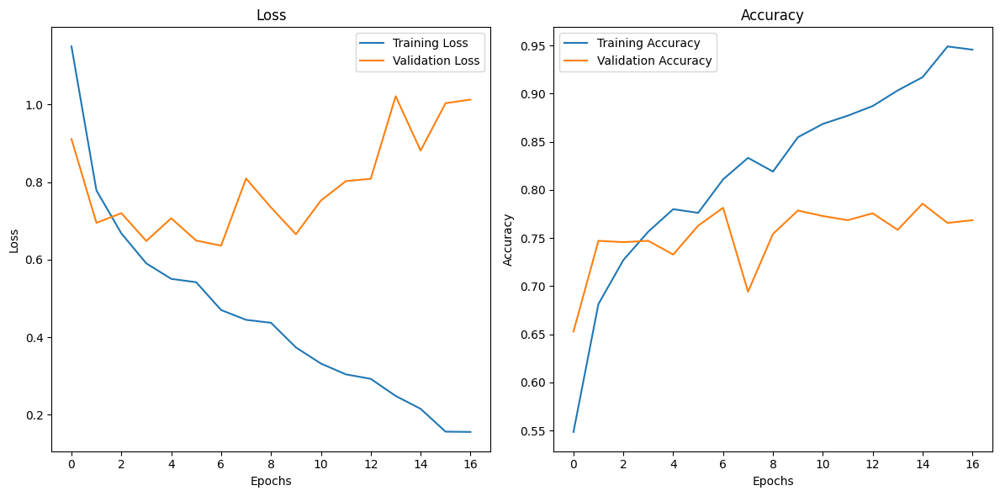

In [ ]:
# Plotting performance model
history_df = pd.DataFrame(base_history_supp.history)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

axes[0].plot(history_df['loss'], label='Training Loss')
axes[0].plot(history_df['val_loss'], label='Validation Loss')
axes[0].set_title('Loss')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Loss')
axes[0].legend()

axes[1].plot(history_df['accuracy'], label='Training Accuracy')
axes[1].plot(history_df['val_accuracy'], label='Validation Accuracy')
axes[1].set_title('Accuracy')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Accuracy')
axes[1].legend()

plt.tight_layout()
plt.show()

In [ ]:
# Prediction
trues = []
preds = []
for img, label in test_data_supp:
  pred = b_model_supp.predict(img, verbose=0)
  pred = pred.argmax(axis=1)
  trues.append(label[0])
  preds.append(pred[0])

In [ ]:
# Prediction measures results
print("F1-Score:", round(f1_score(trues, preds, average='micro', zero_division=1),3))
print("Recall score:", round(recall_score(trues, preds, average='micro', zero_division=1),3))
print("Precision score:", round(precision_score(trues, preds, average='micro', zero_division=1),3))

F1-Score: 0.8
Recall score: 0.8
Precision score: 0.8


In [ ]:
# Model loss value & metrics values in test mode
b_model_supp.evaluate(test_data_supp)

70/70 [==============================] - 28s 342ms/step - loss: 0.5988 - accuracy: 0.7614


[0.5987824201583862, 0.7614285945892334]

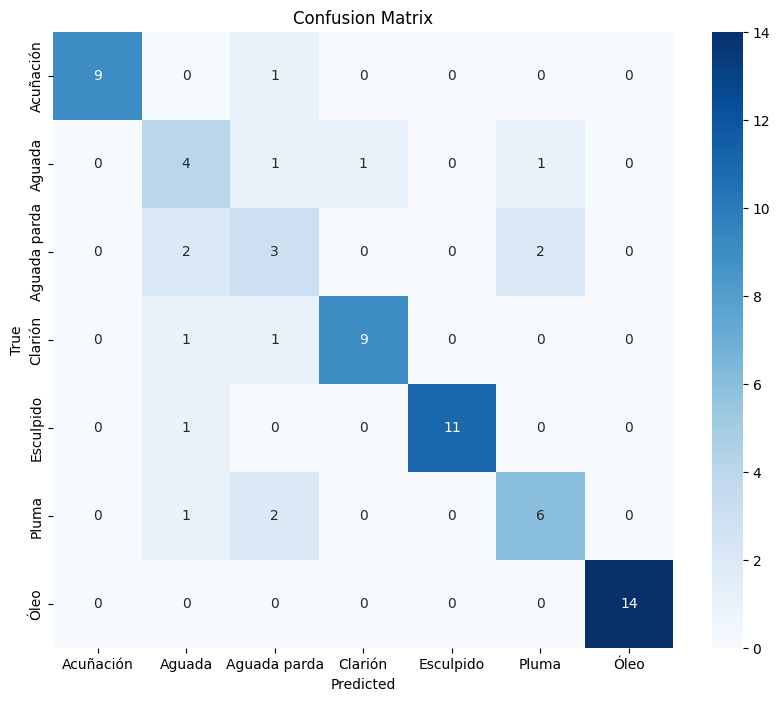

In [ ]:
# Correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(trues, preds), annot=True, cmap='Blues', xticklabels=classes_supp, yticklabels=classes_supp)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [ ]:
print(classification_report(trues, preds, digits=4))

              precision    recall  f1-score   support

           0     1.0000    0.9000    0.9474        10
           1     0.4444    0.5714    0.5000         7
           2     0.3750    0.4286    0.4000         7
           3     0.9000    0.8182    0.8571        11
           4     1.0000    0.9167    0.9565        12
           5     0.6667    0.6667    0.6667         9
           6     1.0000    1.0000    1.0000        14

    accuracy                         0.8000        70
   macro avg     0.7694    0.7574    0.7611        70
weighted avg     0.8234    0.8000    0.8097        70



In [ ]:
tf.keras.backend.clear_session()

# Base Model Augmented

In [ ]:
# Model definition
def base_model_aug():
  model = Sequential()
  model.add(train_aug_supp)

  model.add(layers.Rescaling(1./255, input_shape = (HEIGHT, WIDTH, 3)))

  model.add(layers.Conv2D(16, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.MaxPooling2D())

  model.add(layers.Conv2D(32, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.MaxPooling2D())

  model.add(layers.Conv2D(128, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.MaxPooling2D())

  model.add(layers.Conv2D(256, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.MaxPooling2D())

  model.add(layers.Flatten())

  model.add(layers.Dense(256, activation = 'relu'))
  model.add(layers.Dropout(0.5))

  model.add(layers.Dense(len(classes_supp)))

  model.compile(optimizer = keras.optimizers.Adam(learning_rate=0.001),
                loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics = ['accuracy'])

  return model

In [ ]:
second_model_supp = base_model_aug()
second_model_supp.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 64, 64, 3)         0         
                                                                 
 rescaling (Rescaling)       (None, 64, 64, 3)         0         
                                                                 
 conv2d (Conv2D)             (None, 64, 64, 16)        448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 16, 16, 32)        0         
 g2D)                                                   

In [ ]:
# Training
second_history_supp = second_model_supp.fit(train_data_supp,
                                            validation_data = validation_data_supp,
                                            epochs = EPOCHS,
                                            class_weight = weights_class_supp,
                                            callbacks=[early_stopping])

Epoch 1/20
210/210 [==============================] - 26s 114ms/step - loss: 1.3699 - accuracy: 0.4352 - val_loss: 1.0969 - val_accuracy: 0.5629
Epoch 2/20
210/210 [==============================] - 24s 114ms/step - loss: 1.0419 - accuracy: 0.5876 - val_loss: 0.9503 - val_accuracy: 0.6343
Epoch 3/20
210/210 [==============================] - 22s 103ms/step - loss: 0.9100 - accuracy: 0.6457 - val_loss: 0.7644 - val_accuracy: 0.7057
Epoch 4/20
210/210 [==============================] - 23s 111ms/step - loss: 0.7952 - accuracy: 0.6919 - val_loss: 0.7613 - val_accuracy: 0.7157
Epoch 5/20
210/210 [==============================] - 24s 115ms/step - loss: 0.7711 - accuracy: 0.7029 - val_loss: 0.6742 - val_accuracy: 0.7400
Epoch 6/20
210/210 [==============================] - 25s 118ms/step - loss: 0.7309 - accuracy: 0.7190 - val_loss: 0.7223 - val_accuracy: 0.7129
Epoch 7/20
210/210 [==============================] - 26s 124ms/step - loss: 0.6780 - accuracy: 0.7371 - val_loss: 0.6191 - val_ac

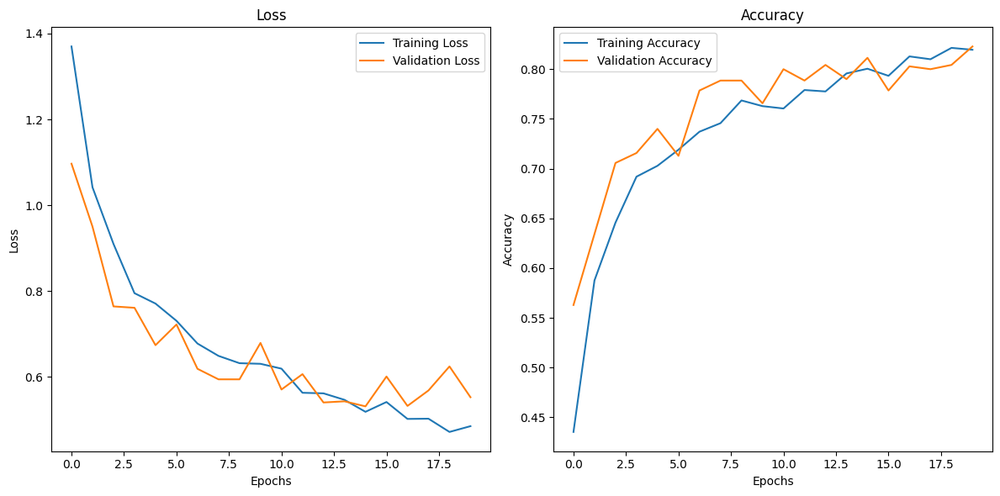

In [ ]:
# Plotting performance model
history_df = pd.DataFrame(second_history_supp.history)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

axes[0].plot(history_df['loss'], label='Training Loss')
axes[0].plot(history_df['val_loss'], label='Validation Loss')
axes[0].set_title('Loss')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Loss')
axes[0].legend()

axes[1].plot(history_df['accuracy'], label='Training Accuracy')
axes[1].plot(history_df['val_accuracy'], label='Validation Accuracy')
axes[1].set_title('Accuracy')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Accuracy')
axes[1].legend()

plt.tight_layout()
plt.show()

In [ ]:
# Prediction
trues = []
preds = []
for img, label in test_data_supp:
  pred = second_model_supp.predict(img, verbose=0)
  pred = pred.argmax(axis=1)
  trues.append(label[0])
  preds.append(pred[0])

In [ ]:
# Prediction measures results
print("F1-Score:", round(f1_score(trues, preds, average='micro', zero_division=1),3))
print("Recall score:", round(recall_score(trues, preds, average='micro', zero_division=1),3))
print("Precision score:", round(precision_score(trues, preds, average='micro', zero_division=1),3))

F1-Score: 0.886
Recall score: 0.886
Precision score: 0.886


In [ ]:
# Model loss value & metrics values in test mode
second_model_supp.evaluate(test_data_supp)

70/70 [==============================] - 21s 272ms/step - loss: 0.5394 - accuracy: 0.8100


[0.5393801927566528, 0.8100000023841858]

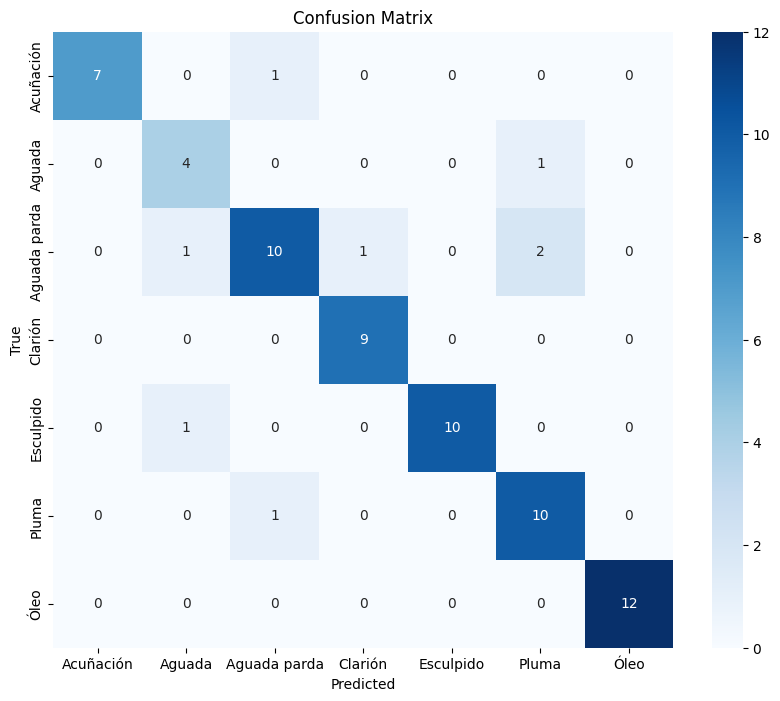

In [ ]:
# Correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(trues, preds), annot=True, cmap='Blues', xticklabels=classes_supp, yticklabels=classes_supp)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [ ]:
print(classification_report(trues, preds, digits=4))

              precision    recall  f1-score   support

           0     1.0000    0.8750    0.9333         8
           1     0.6667    0.8000    0.7273         5
           2     0.8333    0.7143    0.7692        14
           3     0.9000    1.0000    0.9474         9
           4     1.0000    0.9091    0.9524        11
           5     0.7692    0.9091    0.8333        11
           6     1.0000    1.0000    1.0000        12

    accuracy                         0.8857        70
   macro avg     0.8813    0.8868    0.8804        70
weighted avg     0.8937    0.8857    0.8863        70



In [ ]:
tf.keras.backend.clear_session()

# Hyper Parameter Model

In [ ]:
# Model definition
def hyp_mod(hp):
      model = Sequential()
      model.add(layers.Rescaling(1./255))

      model.add(layers.Conv2D(filters=hp.Int('conv_1_filter', min_value=16, max_value=128, step=16, sampling='linear'),
                              kernel_size=hp.Choice('conv_1_kernel', values = [3,5]),
                              activation='relu',
                              padding='same',
                              input_shape=(HEIGHT, WIDTH, 3)))
      model.add(layers.MaxPooling2D())

      model.add(layers.Conv2D(filters=hp.Int('conv_2_filter', min_value=16, max_value=128, step=16, sampling='linear'),
                              kernel_size=hp.Choice('conv_2_kernel', values = [3,5]),
                              padding='same',
                              activation='relu'))
      model.add(layers.MaxPooling2D())

      model.add(layers.Conv2D(filters=hp.Int('conv_3_filter', min_value=16, max_value=128, step=16, sampling='linear'),
                              kernel_size=hp.Choice('conv_3_kernel', values = [3,5]),
                              padding='same',
                              activation='relu'))
      model.add(layers.MaxPooling2D())

      model.add(layers.Conv2D(filters=hp.Int('conv_4_filter', min_value=16, max_value=128, step=16, sampling='linear'),
                              kernel_size=hp.Choice('conv_4_kernel', values = [3,5]),
                              padding='same',
                              activation='relu'))
      model.add(layers.MaxPooling2D())

      model.add(layers.Flatten())

      model.add(layers.Dense(units=hp.Int('dense_1_units', min_value=16, max_value=256, step=16, sampling='linear'),
                             activation='relu'))

      model.add(layers.Dense(len(classes_supp))) #, activation='softmax'


      model.compile(optimizer=keras.optimizers.Adam(learning_rate = 0.001),
                    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                    metrics=['accuracy'])
      return model

tuner = kt.Hyperband(hyp_mod,
                     objective='val_accuracy',
                     max_epochs=10,
                     factor=3,
                     directory='keras_tuner_dir',
                     project_name='keras_tuner_demo2')

tuner.search(train_data_supp,
             epochs=EPOCHS,
             validation_data=validation_data_supp,
             callbacks=[keras.callbacks.EarlyStopping(patience=5)])

Trial 30 Complete [00h 06m 35s]
val_accuracy: 0.800000011920929

Best val_accuracy So Far: 0.800000011920929
Total elapsed time: 01h 57m 06s


In [ ]:
# Selecting best performing model
model_supp = tuner.get_best_models(num_models=1)[0]

In [ ]:
# Training
hyper_history_supp = model_supp.fit(train_data_supp,
                                    epochs=EPOCHS,
                                    class_weight = weights_class_supp,
                                    validation_data=(validation_data_supp),
                                    callbacks=[early_stopping])

Epoch 1/20
210/210 [==============================] - 25s 113ms/step - loss: 0.4491 - accuracy: 0.8305 - val_loss: 0.6905 - val_accuracy: 0.7743
Epoch 2/20
210/210 [==============================] - 22s 105ms/step - loss: 0.4452 - accuracy: 0.8205 - val_loss: 0.6870 - val_accuracy: 0.7714
Epoch 3/20
210/210 [==============================] - 24s 113ms/step - loss: 0.4229 - accuracy: 0.8367 - val_loss: 0.9092 - val_accuracy: 0.7143
Epoch 4/20
210/210 [==============================] - 23s 109ms/step - loss: 0.3814 - accuracy: 0.8457 - val_loss: 0.6932 - val_accuracy: 0.7814
Epoch 5/20
210/210 [==============================] - 21s 102ms/step - loss: 0.3356 - accuracy: 0.8681 - val_loss: 0.6941 - val_accuracy: 0.7829
Epoch 6/20
210/210 [==============================] - 23s 110ms/step - loss: 0.3635 - accuracy: 0.8614 - val_loss: 0.7377 - val_accuracy: 0.7743
Epoch 7/20
210/210 [==============================] - 24s 113ms/step - loss: 0.3103 - accuracy: 0.8838 - val_loss: 0.8695 - val_ac

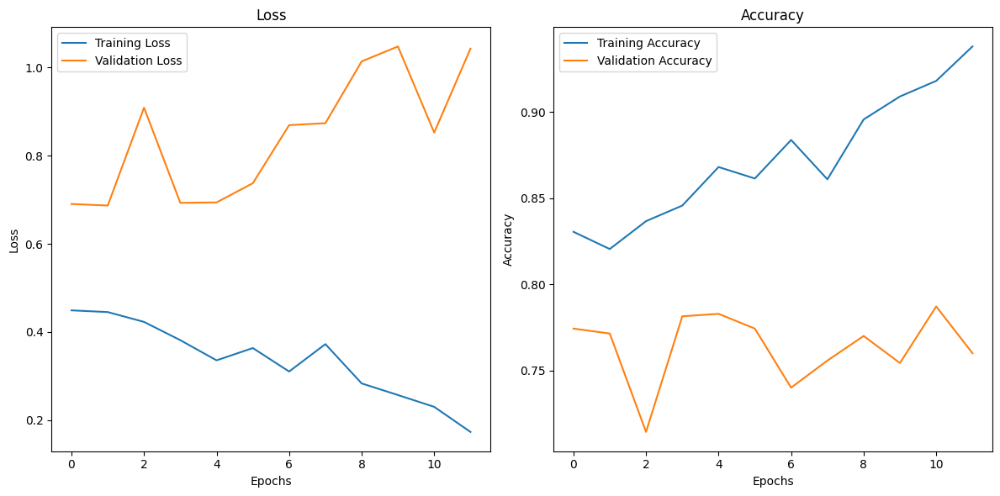

In [74]:
# Plotting results
history_df = pd.DataFrame(hyper_history_supp.history)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

axes[0].plot(history_df['loss'], label='Training Loss')
axes[0].plot(history_df['val_loss'], label='Validation Loss')
axes[0].set_title('Loss')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Loss')
axes[0].legend()

axes[1].plot(history_df['accuracy'], label='Training Accuracy')
axes[1].plot(history_df['val_accuracy'], label='Validation Accuracy')
axes[1].set_title('Accuracy')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Accuracy')
axes[1].legend()

plt.tight_layout()
plt.show()

In [ ]:
# Prediction
trues = []
preds = []
for img, label in test_data_supp:
  pred = model_supp.predict(img, verbose=0)
  pred = pred.argmax(axis=1)
  trues.append(label[0])
  preds.append(pred[0])

assert len(trues) == len(preds)

In [ ]:
# Prediction measures results
print("F1-Score:", round(f1_score(trues, preds, average='micro', zero_division=1),3))
print("Recall score:", round(recall_score(trues, preds, average='micro', zero_division=1),3))
print("Precision score:", round(precision_score(trues, preds, average='micro', zero_division=1),3))

F1-Score: 0.614
Recall score: 0.614
Precision score: 0.614


In [ ]:
# Model loss value & metrics values in test mode
model_supp.evaluate(test_data_supp)

In [ ]:
# Correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(trues, preds), annot=True, cmap='Blues', xticklabels=classes_supp, yticklabels=classes_supp)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [ ]:
print(classification_report(trues, preds, digits=4))

              precision    recall  f1-score   support

           0     0.8667    1.0000    0.9286        13
           1     0.2857    0.4000    0.3333        10
           2     0.3636    0.2857    0.3200        14
           3     0.4615    0.7500    0.5714         8
           4     1.0000    0.9000    0.9474        10
           5     0.7500    0.2727    0.4000        11
           6     1.0000    1.0000    1.0000         4

    accuracy                         0.6143        70
   macro avg     0.6754    0.6583    0.6430        70
weighted avg     0.6451    0.6143    0.6047        70



In [ ]:
tf.keras.backend.clear_session()

# Time

In [ ]:
end_time = time.time()
execution_time = round((end_time - start_time)/60)

print(f"Execution time: {execution_time} minutes")

Execution time: 158 minutes
Execution time: 158 minutes
